In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime

#Считываем данные
df = pd.read_csv('transactions.csv', header=0, sep=',')

In [2]:
# Проверим, есть ли пустые значения в столбцах
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312636 entries, 0 to 312635
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   first_name   312636 non-null  object 
 1   last_name    312636 non-null  object 
 2   email        312636 non-null  object 
 3   country      312636 non-null  object 
 4   gender       312636 non-null  object 
 5   birthdate    312636 non-null  object 
 6   trade_id     312636 non-null  int64  
 7   ticker       312636 non-null  object 
 8   cnt_stock    312636 non-null  int64  
 9   trade_time   312636 non-null  object 
 10  trade_type   312636 non-null  object 
 11  share_price  312636 non-null  float64
dtypes: float64(1), int64(2), object(9)
memory usage: 28.6+ MB


## Подготовка данных

In [3]:
date_columns = ['birthdate', 'trade_time']
df[date_columns] = df[date_columns].apply(pd.to_datetime)
# Посчитаем сколько ушло на покупку акций
df['trade_value'] = df['cnt_stock'] * df['share_price']

# Посчитаем возраст на момент: 2025-04-09
print(datetime.today())
today = datetime.today()
df['age'] = df['birthdate'].apply(lambda x: today.year - x.year - ((today.month, today.day) < (x.month, x.day)))
df['year'] = df['trade_time'].dt.year
df['month'] = df['trade_time'].dt.month

2025-04-16 09:43:51.855283


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312636 entries, 0 to 312635
Data columns (total 16 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   first_name   312636 non-null  object        
 1   last_name    312636 non-null  object        
 2   email        312636 non-null  object        
 3   country      312636 non-null  object        
 4   gender       312636 non-null  object        
 5   birthdate    312636 non-null  datetime64[ns]
 6   trade_id     312636 non-null  int64         
 7   ticker       312636 non-null  object        
 8   cnt_stock    312636 non-null  int64         
 9   trade_time   312636 non-null  datetime64[ns]
 10  trade_type   312636 non-null  object        
 11  share_price  312636 non-null  float64       
 12  trade_value  312636 non-null  float64       
 13  age          312636 non-null  int64         
 14  year         312636 non-null  int32         
 15  month        312636 non-null  int3

## Проведение базового анализа характеристик
### Описательные статистики:

In [5]:
# Выделение df на покупку и продажу
df_buy=df.loc[df['trade_type'] == 'buy'].reset_index(drop=True)
df_sell=df.loc[df['trade_type'] == 'sell'].reset_index(drop=True)

# Подсчет количества уникальных значений
value_counts = df['ticker'].value_counts()
# Нахождение значения с минимальной частотой
least_frequent = value_counts[value_counts == value_counts.min()].index.tolist()
print("Уникальные акции и их частота:", value_counts.reset_index())
print("Акция, встречающиеся реже всего:", least_frequent)

Уникальные акции и их частота:    ticker  count
0    MSFT  10610
1       T  10589
2     HON  10553
3      KO  10546
4     MRK  10524
5    SHEL  10498
6     PLD  10483
7     DIS  10474
8    AAPL  10470
9     NKE  10459
10   META  10440
11    BAC  10440
12    AMT  10439
13    TSM  10414
14     GE  10411
15    LMT  10394
16    JNJ  10394
17    PEP  10383
18     PG  10379
19  GOOGL  10379
20   NVDA  10377
21    PFE  10375
22    CVX  10375
23  BRK.B  10364
24    WFC  10360
25    XOM  10336
26     VZ  10334
27   AMZN  10323
28    UNH  10264
29    JPM  10249
Акция, встречающиеся реже всего: ['JPM']


In [6]:
# Подсчет количества уникальных значений
value_counts = df['ticker'].value_counts()

# Нахождение значения с максимальной частотой
max_education_level = value_counts[value_counts == value_counts.max()].index.tolist()

print("Акция, встречающиеся чаще всего:", max_education_level)

Акция, встречающиеся чаще всего: ['MSFT']


In [7]:
mean = df_buy['trade_value'].mean()
median = df_buy['trade_value'].median()
print("Средние вложения в акции:", mean)
print("Медианное вложения в акции:", median)

Средние вложения в акции: 73477.24236928562
Медианное вложения в акции: 47864.909999999996


In [8]:
mean_country = df_buy.groupby('country').agg({'trade_value': 'mean'}).reset_index()
median_country = df_buy.groupby('country').agg({'trade_value': 'median'}).reset_index()
print("Средние вложения по странам:", mean_country)
print("Медианные вложения по странам:", median_country)

Средние вложения по странам:             country   trade_value
0       Afghanistan  69722.376319
1           Albania  75594.163260
2           Algeria  76819.898080
3    American Samoa  76329.104001
4           AndorrA  73405.027038
..              ...           ...
238  Western Sahara  72236.528925
239           Yemen  73122.201010
240          Zambia  78318.899634
241        Zimbabwe  77373.475591
242   Åland Islands  69925.760201

[243 rows x 2 columns]
Медианные вложения по странам:             country  trade_value
0       Afghanistan    42359.580
1           Albania    48609.200
2           Algeria    50120.205
3    American Samoa    51381.170
4           AndorrA    50274.625
..              ...          ...
238  Western Sahara    47945.230
239           Yemen    47878.720
240          Zambia    52497.720
241        Zimbabwe    48866.760
242   Åland Islands    44035.290

[243 rows x 2 columns]


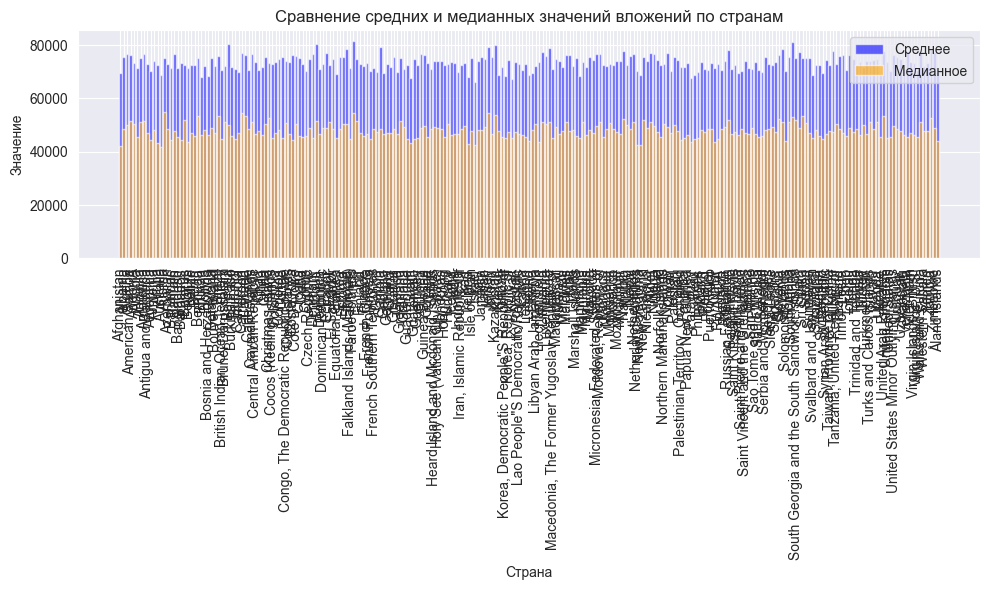

In [9]:
# Создание графика для визуализации различий
plt.figure(figsize=(10, 6))

# График средних значений
plt.bar(mean_country['country'], mean_country['trade_value'], color='blue', alpha=0.6, label='Среднее')

# График медианных значений
plt.bar(median_country['country'], median_country['trade_value'], color='orange', alpha=0.6, label='Медианное')

# Настройки графика
plt.xlabel('Страна')
plt.ylabel('Значение')
plt.title('Сравнение средних и медианных значений вложений по странам')
plt.legend()
plt.xticks(rotation=90)  # Поворот подписей стран для удобства

# Отображение графика
plt.tight_layout()
plt.show()

**Вывод:** Анализ статистических данных в разбивке по странам показывает значительное расхождение между медианным и средним значениями торговой стоимости. Это указывает на наличие выбросов, которые оказывают существенное влияние на среднее значение. Например, в Афганистане медианное значение составляет 42,359.58, а среднее - 69,722. Аналогичная картина наблюдается и в других странах.

In [10]:
# Самый частый возраст
df['age'].mode()
# 28

0    28
Name: age, dtype: int64

In [11]:
# Вложения по регионам и акциям
sum_trade_value_country = df_buy.groupby(['country', 'ticker']).agg({'trade_value': 'sum'}).reset_index()
sum_trade_value_country

,country,ticker,trade_value
0,Afghanistan,AAPL,1547238.90
1,Afghanistan,AMT,1813698.31
2,Afghanistan,AMZN,1098351.63
3,Afghanistan,BAC,466232.78
4,Afghanistan,BRK.B,3815586.22
...,...,...,...
7285,Åland Islands,TSM,1280124.48
7286,Åland Islands,UNH,6373010.79
7287,Åland Islands,VZ,925710.69
7288,Åland Islands,WFC,496075.93


In [12]:
# Средние вложения по регионам и акциям
mean_trade_value_country = df_buy.groupby(['country', 'ticker']).agg({'trade_value': 'mean'}).reset_index()
mean_trade_value_country

,country,ticker,trade_value
0,Afghanistan,AAPL,67271.256522
1,Afghanistan,AMT,82440.832273
2,Afghanistan,AMZN,49925.074091
3,Afghanistan,BAC,14128.266061
4,Afghanistan,BRK.B,141318.008148
...,...,...,...
7285,Åland Islands,TSM,40003.890000
7286,Åland Islands,UNH,236037.436667
7287,Åland Islands,VZ,22040.730714
7288,Åland Islands,WFC,20669.830417


In [13]:
# Средние вложения по регионам и акциям
median_trade_value_country = df_buy.groupby( ['country', 'ticker']).agg({'trade_value': 'median'}).reset_index()
median_trade_value_country

,country,ticker,trade_value
0,Afghanistan,AAPL,54749.280
1,Afghanistan,AMT,76787.850
2,Afghanistan,AMZN,47556.070
3,Afghanistan,BAC,12005.420
4,Afghanistan,BRK.B,127826.250
...,...,...,...
7285,Åland Islands,TSM,35317.020
7286,Åland Islands,UNH,270764.000
7287,Åland Islands,VZ,18143.525
7288,Åland Islands,WFC,18631.055


In [14]:
import plotly.express as px

# Считаем суммарную торговую стоимость по странам
country_trade_value = df_buy.groupby('country')['trade_value'].sum().reset_index()

# Строим карту
fig = px.choropleth(country_trade_value,
                    locations="country",
                    locationmode="country names",
                    color="trade_value",
                    hover_name="country",
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Суммарная торговая стоимость по странам")
fig.show()

In [15]:
# Описательные статистики для cnt_stock и trade_value
print("\nОписание cnt_stock:")
print(df_buy['cnt_stock'].describe())


Описание cnt_stock:
count    191741.000000
mean        500.585331
std         288.293856
min           1.000000
25%         251.000000
50%         501.000000
75%         749.000000
max        1000.000000
Name: cnt_stock, dtype: float64


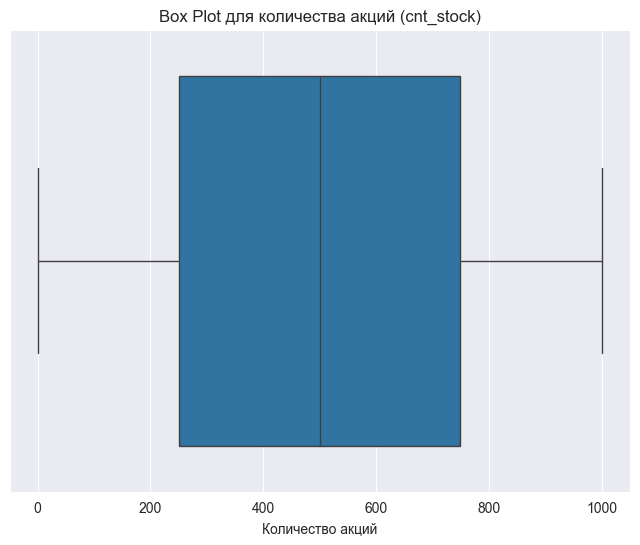

In [16]:
# Box plot для cnt_stock
plt.figure(figsize=(8, 6))
sns.boxplot(x=df_buy['cnt_stock'])
plt.title('Box Plot для количества акций (cnt_stock)')
plt.xlabel('Количество акций')
plt.show()

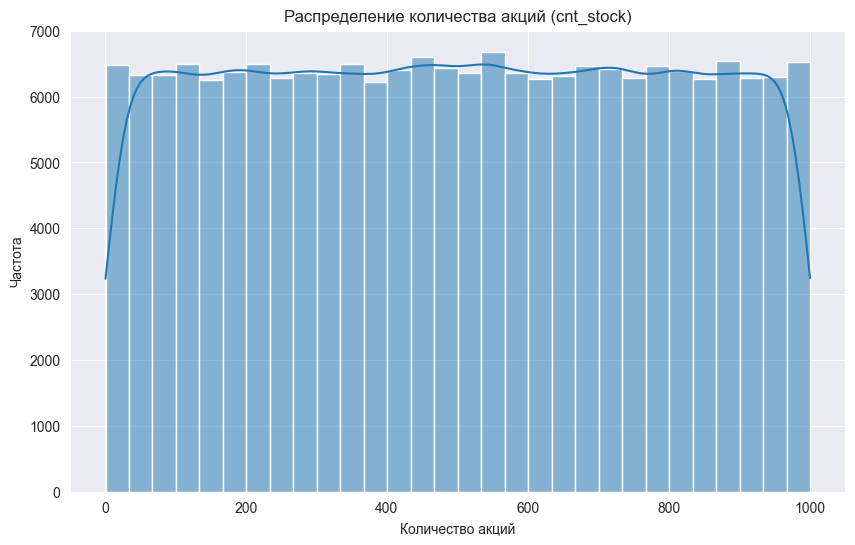

In [17]:
# Задаем количество отрезков
num_bins = 30

# Строим гистограмму
plt.figure(figsize=(10, 6))
sns.histplot(df_buy['cnt_stock'], bins=num_bins, kde=True)  # kde=True добавляет линию KDE
plt.title('Распределение количества акций (cnt_stock)')
plt.xlabel('Количество акций')
plt.ylabel('Частота')
plt.show()

D:\SynologyDrive\Ekaterina\My\Python\statistics_simulative\.venv\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 191741.




Тест Шапиро-Уилка: статистика=0.955, p-значение=0.000
Распределение значительно отличается от нормального


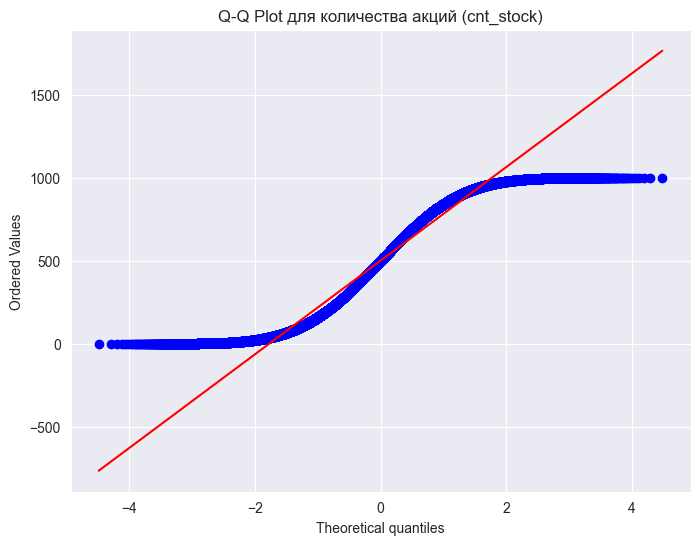

In [18]:
from scipy import stats

# Тест Шапиро-Уилка
shapiro_test = stats.shapiro(df_buy['cnt_stock'])
print(f"\nТест Шапиро-Уилка: статистика={shapiro_test[0]:.3f}, p-значение={shapiro_test[1]:.3f}")

alpha = 0.05
if shapiro_test[1] < alpha:
    print("Распределение значительно отличается от нормального")
else:
    print("Нет достаточных оснований утверждать, что распределение отличается от нормального")

# Q-Q plot
plt.figure(figsize=(8, 6))
stats.probplot(df_buy['cnt_stock'], dist="norm", plot=plt)
plt.title('Q-Q Plot для количества акций (cnt_stock)')
plt.show()

Вывод: 
- В среднем, трейдеры приобретают около 500 акций за сделку (среднее значение = 500). Распределение количества акций демонстрирует умеренный разброс вокруг этого среднего значения, о чем свидетельствует стандартное отклонение в размере 288.
- Визуальный анализ с использованием гистограммы и оценка плотности ядра (KDE) позволяют предположить, что распределение cnt_stock близко к равномерному. Это означает, что сделки с различным количеством акций происходят с примерно одинаковой частотой. Однако, тест Шапиро-Уилка, примененный для формальной проверки на соответствие нормальному распределению, отверг гипотезу о нормальности.
- Анализ с использованием box plot не выявил значительных выбросов в данных, что говорит об отсутствии аномально крупных или малых сделок, существенно отличающихся от основной массы.
- Тот факт, что среднее значение (500) и медиана (501) практически совпадают, подтверждает симметричность распределения cnt_stock.

In [19]:
print("\nОписание trade_value:")
print(df_buy['trade_value'].describe())


Описание trade_value:
count    191741.000000
mean      73477.242369
std       79137.386768
min          12.910000
25%       19714.240000
50%       47864.910000
75%       98945.820000
max      547785.000000
Name: trade_value, dtype: float64


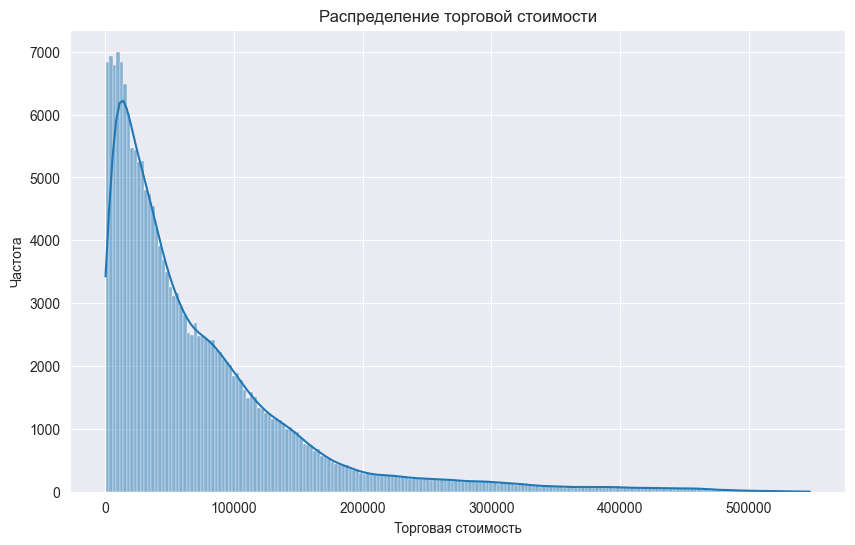

12.91 547785.0


In [20]:
# Гистограмма Распределение торговой стоимости
plt.figure(figsize=(10, 6))
sns.histplot(df_buy['trade_value'], kde=True)  # kde=True добавляет кривую плотности
plt.title('Распределение торговой стоимости')
plt.xlabel('Торговая стоимость')
plt.ylabel('Частота')
plt.show()
print(df_buy['trade_value'].min(),df_buy['trade_value'].max())

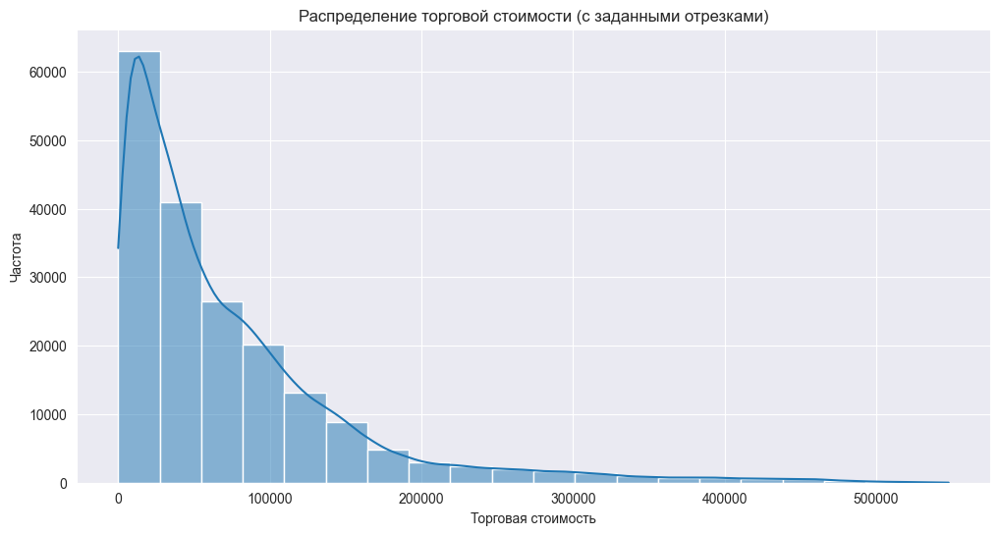

In [21]:
min_trade_value = df_buy['trade_value'].min()
max_trade_value = df_buy['trade_value'].max()
num_bins = 20

# Рассчитываем ширину каждого отрезка
bin_width = (max_trade_value - min_trade_value) / num_bins

# Создаем список границ отрезков
bins = [min_trade_value + i * bin_width for i in range(num_bins + 1)]
# Построение гистограммы с указанными границами отрезков
plt.figure(figsize=(12, 6))
sns.histplot(df_buy['trade_value'], bins=bins, kde=True)
plt.title('Распределение торговой стоимости (с заданными отрезками)')
plt.xlabel('Торговая стоимость')
plt.ylabel('Частота')
plt.show()

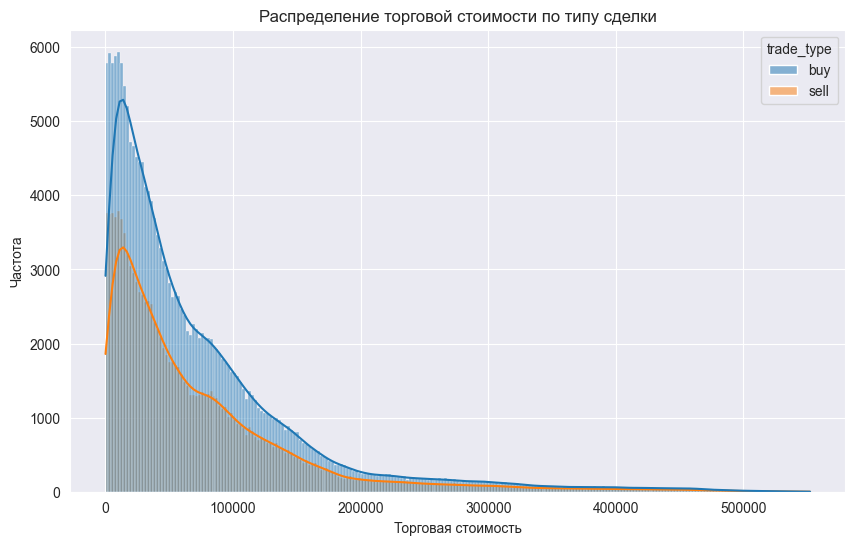

In [22]:
# Анализ по типу сделки (покупка/продажа)
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='trade_value', hue='trade_type', kde=True)
plt.title('Распределение торговой стоимости по типу сделки')
plt.xlabel('Торговая стоимость')
plt.ylabel('Частота')
plt.show()

D:\SynologyDrive\Ekaterina\My\Python\statistics_simulative\.venv\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 191741.




Тест Шапиро-Уилка: статистика=0.775, p-значение=0.000
Распределение значительно отличается от нормального


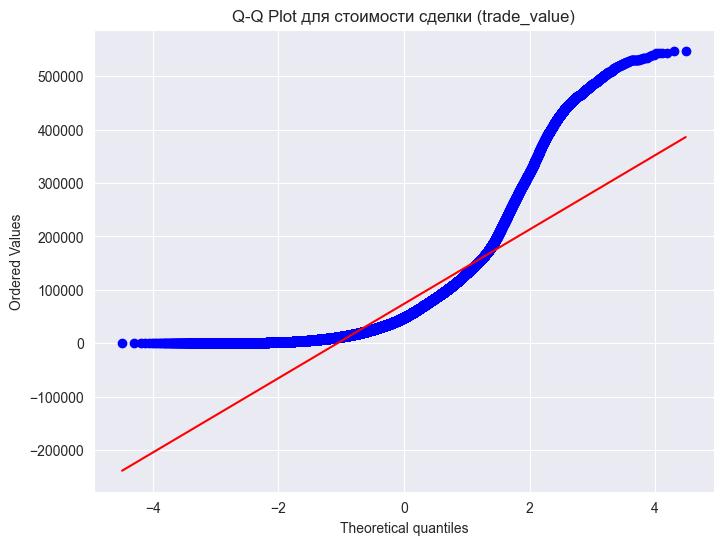

In [23]:
from scipy import stats

# Тест Шапиро-Уилка
shapiro_test = stats.shapiro(df_buy['trade_value'])
print(f"\nТест Шапиро-Уилка: статистика={shapiro_test[0]:.3f}, p-значение={shapiro_test[1]:.3f}")

alpha = 0.05
if shapiro_test[1] < alpha:
    print("Распределение значительно отличается от нормального")
else:
    print("Нет достаточных оснований утверждать, что распределение отличается от нормального")

# Q-Q plot
plt.figure(figsize=(8, 6))
stats.probplot(df_buy['trade_value'], dist="norm", plot=plt)
plt.title('Q-Q Plot для стоимости сделки (trade_value)')
plt.show()

Выводы: 

- Как для общего распределения (на гистограмме), так и для сделок покупки (на основе описательных статистик), распределение trade_value имеет положительную скошенность. Это означает, что:
    - Большинство сделок имеют относительно небольшую торговую стоимость.
    - Есть небольшое количество сделок с очень высокой торговой стоимостью, которые “вытягивают” среднее значение вправо.
- Большой разброс значений: Высокое стандартное отклонение указывает на значительный разброс торговой стоимости сделок. Это означает, что в данных есть как мелкие, так и крупные сделки.
- Сравнение с медианой: Медиана (47,865) значительно меньше среднего (73,477), что еще раз подтверждает положительную скошенность распределения.
- Тест Шапиро-Уилка подтвердил, что гипотезу о нормальности данных следует отклонить

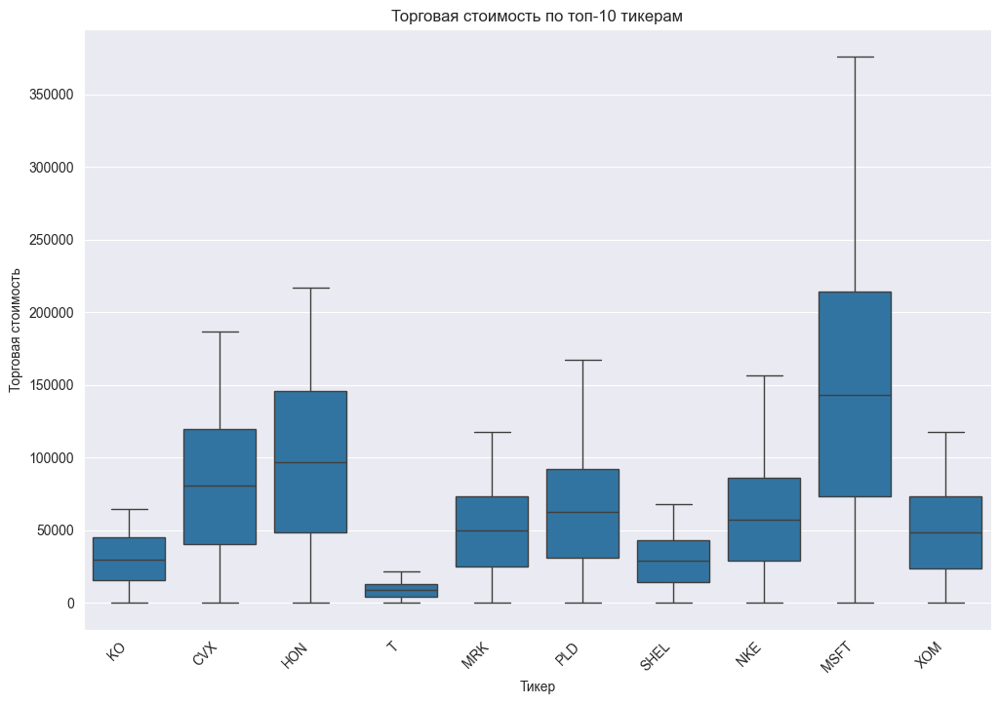

In [24]:
# 6. Анализ по тикеру (Топ-10)
top_10_tickers = df_buy['ticker'].value_counts().nlargest(10).index  # Получаем список топ-10 тикеров
df_top_10 = df_buy[df_buy['ticker'].isin(top_10_tickers)] # Фильтруем DataFrame
plt.figure(figsize=(12, 8))
sns.boxplot(x='ticker', y='trade_value', data=df_top_10)  # boxplot
plt.title('Торговая стоимость по топ-10 тикерам')
plt.xlabel('Тикер')
plt.ylabel('Торговая стоимость')
plt.xticks(rotation=45, ha='right')  # Поворот меток для лучшей читаемости
plt.show()

<Axes: >

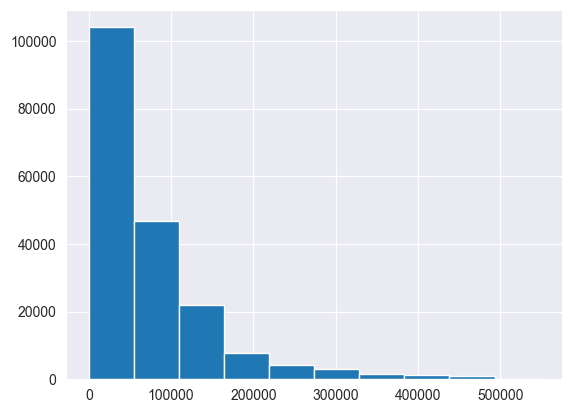

In [25]:
df_buy_2022 = df_buy['trade_value'][(df_buy['trade_time'] > '2022-01-01') & (df_buy['trade_time'] < '2023-12-31')].reset_index(drop=True)
df_buy_2022 = pd.DataFrame(df_buy_2022)
df_buy_2022['trade_value'].hist(bins=10)

На основании проведенного анализа, мы установили, что имеющиеся данные не соответствуют равномерному распределению. В связи с этим, целесообразно рассмотреть возможность применения различных методов для преобразования данных с целью приближения их к нормальному распределению.

In [26]:
# считаем натуральный логарифм от данных
df_buy['натуральный_логарифм_trade_value'] = np.log(df_buy['trade_value'])
# считаем десятичный логарифм от данных
df_buy['десятичный_логарифм_trade_value'] = np.log(df_buy['trade_value'])
# квадратный корень
df_buy['квадратный_корень_trade_value'] = np.sqrt(df_buy['trade_value'])
# кубический корень 
df_buy['кубический_корень_trade_value']  = np.cbrt(df_buy['trade_value'])
# обратная дробь 
df_buy['обратная_дробь_trade_value']  = 1/df_buy['trade_value']

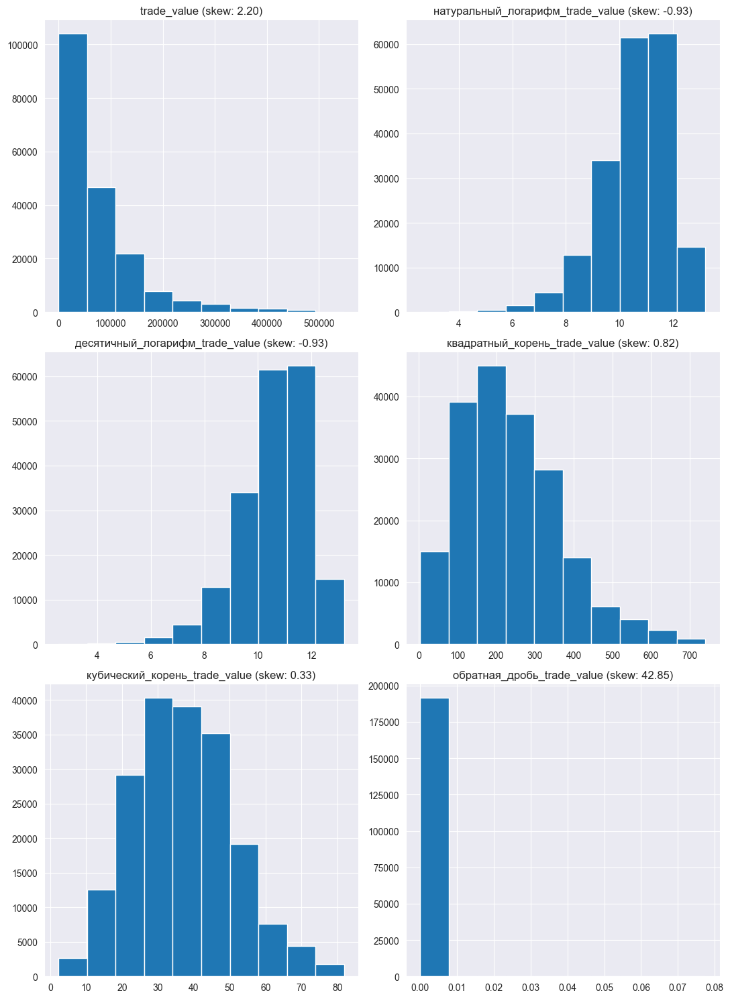

In [27]:
columns_to_plot = ['trade_value', 'натуральный_логарифм_trade_value', 
                   'десятичный_логарифм_trade_value', 'квадратный_корень_trade_value', 
                   'кубический_корень_trade_value', 'обратная_дробь_trade_value']


# Вычисление коэффициентов асимметрии
skew_values = {column: df_buy[column].skew() for column in columns_to_plot}

# Создание гистограмм
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(11, 15))  # Указание количества строк и столбцов

for ax, column in zip(axes.flatten(), columns_to_plot):
    df_buy[column].hist(ax=ax, bins=10)  # Отрисовка гистограммы
    skewness = skew_values[column]
    ax.set_title(f'{column} (skew: {skewness:.2f})')

plt.tight_layout()
plt.show()

Итак, у нормального распределения коэффициент асимметрии равен 0. Самое близкое к 0 значение показало преобразование кубического корня. Снова проведем тест Шапиро-Уилка и взглянем на гистограмму.

D:\SynologyDrive\Ekaterina\My\Python\statistics_simulative\.venv\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 191741.




Тест Шапиро-Уилка: статистика=0.991, p-значение=2.092579517888111e-65
Распределение значительно отличается от нормального


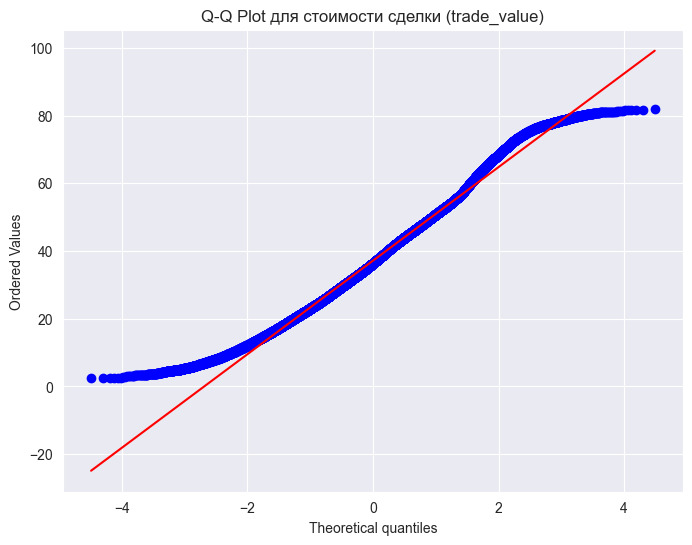

In [28]:
from scipy import stats

# Тест Шапиро-Уилка
shapiro_test = stats.shapiro(df_buy['кубический_корень_trade_value'])
print(f"\nТест Шапиро-Уилка: статистика={shapiro_test[0]:.3f}, p-значение={shapiro_test[1]}")

alpha = 0.05
if shapiro_test[1] < alpha:
    print("Распределение значительно отличается от нормального")
else:
    print("Нет достаточных оснований утверждать, что распределение отличается от нормального")

# Q-Q plot
plt.figure(figsize=(8, 6))
stats.probplot(df_buy['кубический_корень_trade_value'], dist="norm", plot=plt)
plt.title('Q-Q Plot для стоимости сделки (trade_value)')
plt.show()

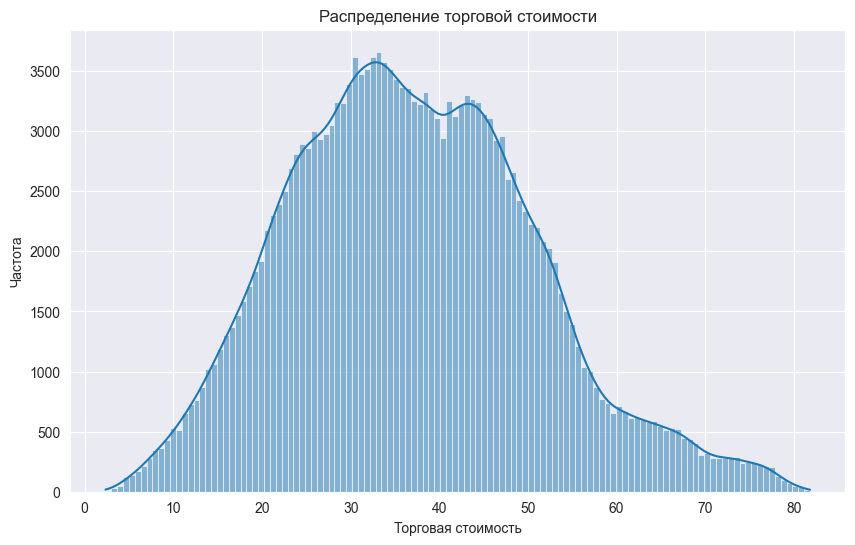

In [29]:
# Гистограмма Распределение торговой стоимости
plt.figure(figsize=(10, 6))
sns.histplot(df_buy['кубический_корень_trade_value'], kde=True)  # kde=True добавляет кривую плотности
plt.title('Распределение торговой стоимости')
plt.xlabel('Торговая стоимость')
plt.ylabel('Частота')
plt.show()

**Вывод:** После неудачных попыток преобразования данных для достижения нормального распределения, было принято решение о применении непараметрических статистических методов в дальнейших исследованиях.

### Гипотезы

Проверить гипотезу о равенстве дисперсий для trade_value в период 2022 - 2023, используя непараметрические критерии Uzbekistan и Russian Federation.

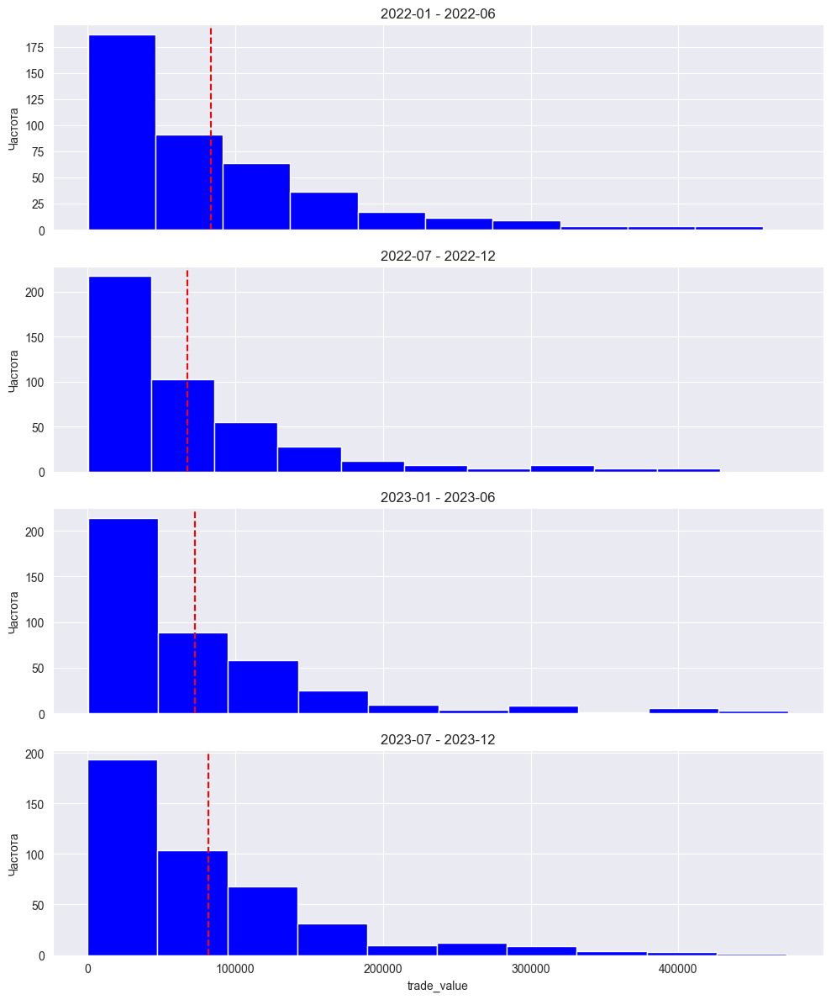

In [30]:
# Преобразуем столбцы 'year' и 'month' в один столбец datetime
df_buy['date'] = pd.to_datetime(df_buy[['year', 'month']].assign(DAY=1))

year_ranges = [('2022-01', '2022-06'), ('2022-07', '2022-12'),
               ('2023-01', '2023-06'), ('2023-07', '2023-12')]

region = ['Uzbekistan', 'Russian Federation']

filtered_df = []

# название датафрейма
df1 = df_buy.loc[df_buy['country'].isin(region)]

# столбец для группировки
group = 'date'

# анализируемый признак
attribute = 'trade_value'

# Создаем подграфики
fig, axs = plt.subplots(len(year_ranges), sharex=True, figsize=(10, len(year_ranges) * 3)) # Размер по высоте

for i, val in enumerate(year_ranges):
    # создаем отфильтрованные датареймы и записываем в список filtered_df
    start, end = val
    start_date = pd.to_datetime(start)
    end_date = pd.to_datetime(end)
    filtered_df.append(df1[(df1[group].between(start_date, end_date))])

    # строим гистограмму для признака attribute
    ax = axs[i]  # Получаем текущую ось (подграфик)
    ax.hist(filtered_df[i][attribute], color='blue')

    # отображаем на гистограмме среднее значение признака attribute
    ax.axvline(x=filtered_df[i][attribute].mean(), color='red', linestyle='--')
    ax.set_title(f"{start} - {end}")
    ax.set_ylabel('Частота')  # Подпись оси Y для каждого подграфика

plt.xlabel(attribute)  # Подпись оси X для всего графика
plt.tight_layout()
plt.show()

In [31]:
from scipy.stats import levene, fligner, kruskal

levene(filtered_df[0][attribute], filtered_df[1][attribute])
# LeveneResult(statistic=np.float64(6.300255969522795), pvalue=np.float64(0.012254897456681542))

LeveneResult(statistic=np.float64(6.300255969522795), pvalue=np.float64(0.012254897456681542))

In [32]:
fligner(filtered_df[0][attribute], filtered_df[1][attribute])
# FlignerResult(statistic=np.float64(16.142754215986663), pvalue=np.float64(5.874286321676387e-05))

FlignerResult(statistic=np.float64(16.142754215986663), pvalue=np.float64(5.874286321676387e-05))

**Вывод:** Оба критерия показали, что на уровне значимости 0.05 нам нужно отклонить гипотезу равенстве дисперсий. На уровне значимости 0.01 Критерий Флигнера продолжает указывать на отклонение гипотезы о равенстве дисперсий. Однако, критерий Левена больше не дает оснований для отклонения этой гипотезы.

**Нулевая гипотеза (H0):** Две выборки взяты из одной генеральной совокупности.
**Альтернативная гипотеза (H1):** Две выборки взяты из разных генеральных совокупностей

In [33]:
from scipy.stats import mannwhitneyu, kstest, anderson_ksamp

# Фильтруем данные для двух стран
sample1 = df_buy[df_buy['country'] == 'Uzbekistan']['trade_value']
sample2 = df_buy[df_buy['country'] == 'Russian Federation']['trade_value']
# Применение критерия Манна-Уитни
statistic, p_value = mannwhitneyu(sample1, sample2, alternative='two-sided')
# Выводим результаты
print(f"Статистика U: {statistic}")
print(f"P-значение: {p_value}")

# Интерпретируем результаты
alpha = 0.05
if p_value < alpha:
    print("Различие между распределениями статистически значимо.")
else:
    print("Нет статистически значимых различий между распределениями.")

Статистика U: 353192.0
P-значение: 0.218856356571292
Нет статистически значимых различий между распределениями.


**Вывод:** две выборки взяты из оной ГС. Нет оснований отвергать H0 гипотезу.

Проведем аналогичный тест, но с использованием тест Смирнова и разделим данные по гендеру

In [34]:
sample1 = df_buy[df_buy['gender'] == 'Female']['trade_value']
sample2 = df_buy[df_buy['gender'] == 'Male']['trade_value']
# Применяем двухвыборочный K-S test
statistic, p_value = kstest(sample1, sample2)

 # Выводим результаты
print(f"Статистика K-S: {statistic}")
print(f"P-значение: {p_value}")

# Интерпретируем результаты
alpha = 0.05
if p_value < alpha:
    print("Распределения двух выборок статистически значимо различаются.")
else:
    print("Нет статистически значимых различий между распределениями двух выборок.")

Статистика K-S: 0.003768667213915222
P-значение: 0.992596949264759
Нет статистически значимых различий между распределениями двух выборок.


**Вывод:** две выборки взяты из одного и того же распределения. Нет оснований отвергать H0 гипотезу.

Возьмем 4 разных выборки по годам-полугодиям и проверим, взяты ли они из одного распределения.

In [35]:
# Тест Андерсона-Дарлинга
result = anderson_ksamp([filtered_df[0][attribute], filtered_df[1][attribute], filtered_df[2][attribute], filtered_df[3][attribute]])
p_value = result.pvalue
if p_value < alpha:
    print(f"P-значение ({p_value:.4f}) меньше уровня значимости ({alpha}), поэтому отклоняем нулевую гипотезу.")
    print("Выборки, вероятно, взяты из разных распределений.")
else:
    print(f"P-значение ({p_value:.4f}) больше уровня значимости ({alpha}), поэтому не отклоняем нулевую гипотезу.")
    print("Нет достаточных оснований утверждать, что выборки взяты из разных распределений.")
result

P-значение (0.0018) меньше уровня значимости (0.05), поэтому отклоняем нулевую гипотезу.
Выборки, вероятно, взяты из разных распределений.


Anderson_ksampResult(statistic=np.float64(4.650692121224814), critical_values=array([0.49854918, 1.3236709 , 1.91577682, 2.49304213, 3.24593219,
       3.82285604, 5.12078789]), pvalue=0.0017974445861929122)

<Axes: xlabel='trade_value', ylabel='Density'>

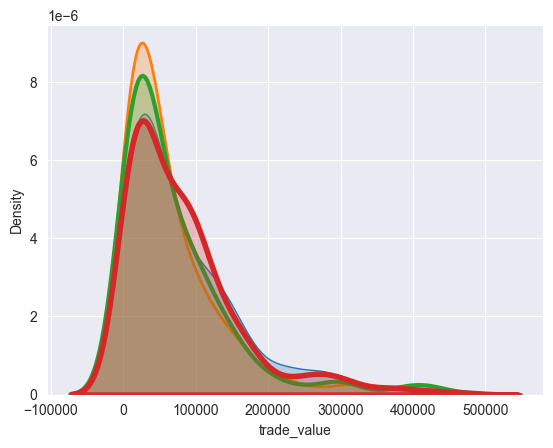

In [36]:
sns.kdeplot(data=filtered_df[0], x=attribute, fill=True, linewidth=1)
sns.kdeplot(data=filtered_df[1], x=attribute, fill=True, linewidth=2)
sns.kdeplot(data=filtered_df[2], x=attribute, fill=True, linewidth=3)
sns.kdeplot(data=filtered_df[3], x=attribute, fill=True, linewidth=4)


Видно, что распределения отличаются, но есть выборки очень похожие - 2022-01 2022-06 и 2023-07 2023-12. Проведем тест только для них.

In [37]:
from scipy.stats import *
alpha = 0.05
result = anderson_ksamp([filtered_df[0][attribute], filtered_df[3][attribute]])
p_value = result.pvalue
if p_value < alpha:
    print(f"P-значение ({p_value:.4f}) меньше уровня значимости ({alpha}), поэтому отклоняем нулевую гипотезу.")
    print("Выборки, вероятно, взяты из разных распределений.")
else:
    print(f"P-значение ({p_value:.4f}) больше уровня значимости ({alpha}), поэтому не отклоняем нулевую гипотезу.")
    print("Нет достаточных оснований утверждать, что выборки взяты из разных распределений.")
result


P-значение (0.2500) больше уровня значимости (0.05), поэтому не отклоняем нулевую гипотезу.
Нет достаточных оснований утверждать, что выборки взяты из разных распределений.


C:\Users\ekate\AppData\Local\Temp\ipykernel_204\4004873241.py:3: UserWarning:

p-value capped: true value larger than 0.25. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)



Anderson_ksampResult(statistic=np.float64(-0.6477166008912902), critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), pvalue=np.float64(0.25))

**Вывод:** для совокупности выборок мы отвергаем H0 гипотезу, но конкретно для выборок 2022-01 2022-06 и 2023-07 2023-12 на уровне значимости 0.05 мы не отвергаем нулевую гипотезу. Это означает, что различия между всеми полугодиями в целом статистически значимы, но конкретно эти два полугодия (2022-01/2022-06 и 2023-07/2023-12) имеют распределения, которые достаточно похожи, чтобы не отклонять гипотезу об их идентичности. Возможно, на эти периоды приходятся схожие экономические условия или сезонные факторы, влияющие на торговую активность.

**Нулевая гипотеза (H0):** Распределения количества сделок на покупку для девушек и мужчин одинаковы
**Альтернативная гипотеза (H1):** Девушки совершают больше сделок на покупку, чем мужчины.

In [38]:
df_buy_Female = df_buy[df_buy['gender'] == 'Female'].groupby('last_name').agg({'trade_value': 'count'})
sdf_buy_Male = df_buy[df_buy['gender'] == 'Male'].groupby('last_name').agg({'trade_value': 'count'})
# Используем непараметрический тест Манна-Уитни
statistic, p_value = mannwhitneyu(df_buy_Female, sdf_buy_Male, alternative='greater')
print(f"Статистика U: {statistic}")
print(f"P-значение: {p_value}")
alpha = 0.05
print(f"\nУровень значимости (alpha): {alpha}")
if p_value < alpha:
    print("P-значение меньше уровня значимости.")
    print("Отклоняем нулевую гипотезу: Девушки совершают больше сделок, чем мужчины.")
else:
    print("P-значение больше уровня значимости.")
    print("Не отклоняем нулевую гипотезу: Нет достаточных доказательств утверждать, что девушки совершают больше сделок, чем мужчины.")

Статистика U: [1205600.]
P-значение: [0.]

Уровень значимости (alpha): 0.05
P-значение меньше уровня значимости.
Отклоняем нулевую гипотезу: Девушки совершают больше сделок, чем мужчины.


**Вывод:** на уровне значимости 0.05 мы отклоняем нулевую гипотезу в пользу альтернативной, что девушки совершают больше сделок на покупку, чем мужчины. Возможно, это связано с изменением гендерных стереотипов и ростом финансовой грамотности среди женщин.

**Нулевая гипотеза (H0):** Средняя сумма сделки на покупку не меняется между 2022 и 2023 годами
**Альтернативная гипотеза (H1):** Средняя сумма сделки на покупку изменилась между 2022 и 2023 годами

In [39]:
trades_2022 = df_buy[df_buy['year'] == 2022]['trade_value']
trades_2023 = df_buy[df_buy['year'] == 2023]['trade_value']
# Применяем тест Манна-Уитни (двусторонний)
statistic, p_value = mannwhitneyu(trades_2022, trades_2023, alternative='two-sided')
# Выводим результаты
print("Сравнение 2022 и 2023 годов (тест Манна-Уитни):")
print(f"Статистика U: {statistic}")
print(f"P-значение: {p_value}")

# Интерпретируем результаты
alpha = 0.05
if p_value < alpha:
    print(f"P-значение ({p_value:.4f}) < α ({alpha}): Отклоняем нулевую гипотезу.")
    print("Есть статистически значимые различия в средней сумме сделки между 2022 и 2023 годами.")
else:
    print(f"P-значение ({p_value:.4f}) >= α ({alpha}): Не отклоняем нулевую гипотезу.")
    print("Нет достаточных оснований утверждать, что средняя сумма сделки изменилась между 2022 и 2023 годами.")

Сравнение 2022 и 2023 годов (тест Манна-Уитни):
Статистика U: 4500319711.0
P-значение: 3.871672826906339e-15
P-значение (0.0000) < α (0.05): Отклоняем нулевую гипотезу.
Есть статистически значимые различия в средней сумме сделки между 2022 и 2023 годами.


**Вывод:** На уровне значимости 0.05 мы отклоняем нулевую гипотезу в пользу альтернативной. Возможно, это связано с ростом инфляции, что привело к увеличению номинальной стоимости активов и, соответственно, к увеличению средней суммы сделки в 2023 году.

**Нулевая гипотеза (H0):** Средняя сумма сделки одинакова для покупок и продаж.
**Альтернативная гипотеза (H1):** Средняя сумма сделки отличается для покупок и продаж

In [40]:
# Применяем тест Манна-Уитни 
statistic, p_value = mannwhitneyu(df_buy['trade_value'], df_sell['trade_value'], alternative='two-sided')

# Выводим результаты
print("Сравнение сумм сделок для покупок и продаж (тест Манна-Уитни):")
print(f"Статистика U: {statistic}")
print(f"P-значение: {p_value}")

# Интерпретируем результаты
alpha = 0.05
if p_value < alpha:
    print(f"P-значение ({p_value:.4f}) < α ({alpha}): Отклоняем нулевую гипотезу.")
    print("Есть статистически значимые различия в средней сумме сделки между покупками и продажами.")
else:
    print(f"P-значение ({p_value:.4f}) >= α ({alpha}): Не отклоняем нулевую гипотезу.")
    print("Нет достаточных оснований утверждать, что средняя сумма сделки отличается между покупками и продажами.")

Сравнение сумм сделок для покупок и продаж (тест Манна-Уитни):
Статистика U: 11616910302.0
P-значение: 0.2782377118839888
P-значение (0.2782) >= α (0.05): Не отклоняем нулевую гипотезу.
Нет достаточных оснований утверждать, что средняя сумма сделки отличается между покупками и продажами.


**Вывод:** На уровне значимости 0.05 мы не отклоняем нулевую гипотезу в пользу альтернативной. Возможно, крупные институциональные инвесторы активно участвуют как в покупках, так и в продажах, выравнивая средние суммы сделок.

**Нулевая гипотеза (H0):** Средние значения торговых значений (trade_value) между Канадой, Российской Федерацией, Бразилией и Соединенными Штатами равны.

**Альтернативная гипотеза (H1):** Средние значения торговых значений (trade_value) между Канадой, Российской Федерацией, Бразилией и Соединенными Штатами не равны.

In [41]:
df_buy_Canada = df_buy[df_buy['country'] == 'Canada']
df_buy_Canada_Russian_Federation = df_buy[df_buy['country'] == 'Russian Federation']
df_buy_Brazil = df_buy[df_buy['country'] == 'Brazil']
df_buy_United_States = df_buy[df_buy['country'] == 'United States']

# Выполнение теста Краскела-Уоллиса
stat, p_value = kruskal(
    df_buy_Canada['trade_value'],
    df_buy_Canada_Russian_Federation['trade_value'],
    df_buy_Brazil['trade_value'],
    df_buy_United_States['trade_value']
)

# Вывод результатов
print(f"Статистика теста: {stat}")
print(f"P-значение: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Средние значения торговых значений между странами не равны.")
else:
    print("Не отвергаем нулевую гипотезу: Средние значения торговых значений между странами равны.")

Статистика теста: 6.08408599374801
P-значение: 0.10759015905187216
Не отвергаем нулевую гипотезу: Средние значения торговых значений между странами равны.


**Вывод:** На уровне значимости 0.05 мы не отклоняем нулевую гипотезу в пользу альтернативной. 

Проанализировав активность пользователей в 2022 году, руководство решило добавить на сайт рекомендации по покупкам акций. Эти рекомендации были размещены на сайте в начале 2023 года. Соответственно, необходимо проверить гипотезу о том, повлияло ли внедрение рекомендаций на средний чек покупок акций пользователей.
**Нулевая гипотеза (H0):** Внедрение рекомендаций на сайте (вначале 2023 году) не повлияло на средний чек покупок акций пользователей.
**Альтернативная гипотеза (H1):** Внедрение рекомендаций на сайте (вначале 2023 году) повлияло на средний чек покупок акций пользователей.

In [57]:
import pandas as pd
from scipy.stats import mannwhitneyu

# Агрегируем данные по пользователям, чтобы получить общую сумму покупок для каждого пользователя за каждый год
df_aggregated = df_buy.groupby(['first_name', 'last_name', 'year'])['trade_value'].sum().reset_index()

# Разделяем данные на две группы: 2022 и 2023 годы
trades_2022 = df_aggregated[df_aggregated['year'] == 2022]['trade_value']
trades_2023 = df_aggregated[df_aggregated['year'] == 2023]['trade_value']
# Выполнение теста Манна-Уитни
stat, p_value = mannwhitneyu(trades_2022, trades_2023, alternative='two-sided')

# Вывод результатов
print(f"Статистика теста: {stat}")
print(f"P-значение: {p_value}")

# Интерпретация результатов
alpha = 0.05
if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Внедрение рекомендаций повлияло на средний чек покупок акций пользователей.")
else:
    print("Не отвергаем нулевую гипотезу: Внедрение рекомендаций не повлияло на средний чек покупок акций пользователей.")

Статистика теста: 1766848809.0
P-значение: 8.870474352048414e-11
Отвергаем нулевую гипотезу: Внедрение рекомендаций повлияло нна средний чек покупок акций пользователей.


In [72]:
df_buy['age_group'] = pd.cut(df_buy['age'], bins=[24, 34, 44, 54], labels=['24-34', '35-44', '45-54'])

df_aggregated = df_buy.groupby(['first_name', 'last_name', 'age_group'])['trade_value'].sum().reset_index()

age_group_24_34 = df_aggregated[df_aggregated['age_group'] == '24-34']['trade_value']
age_group_35_44 = df_aggregated[df_aggregated['age_group'] == '35-44']['trade_value']
age_group_45_54 = df_aggregated[df_aggregated['age_group'] == '45-54']['trade_value']

# Выполнение теста Краскела-Уоллиса
stat, p_value = kruskal(age_group_24_34, age_group_35_44, age_group_45_54)

print(f"Статистика теста: {stat}")
print(f"P-значение: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Средний чек покупок акций пользователей зависит от возрастной группы.")
else:
    print("Не отвергаем нулевую гипотезу: Средний чек покупок акций пользователей не зависит от возрастной группы.")

C:\Users\ekate\AppData\Local\Temp\ipykernel_204\803144996.py:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Статистика теста: 37633.57656283976
P-значение: 0.0
Отвергаем нулевую гипотезу: Средний чек покупок акций пользователей зависит от возрастной группы.


In [73]:
#посмотрим p-value для комбинаций пар
import scikit_posthocs as sp
data = [age_group_24_34, age_group_35_44, age_group_45_54]
sp.posthoc_dunn(data, p_adjust = 'bonferroni')

,1,2,3
1,1.0,1.0,0.0
2,1.0,1.0,0.0
3,0.0,0.0,1.0


**Вывод:** На уровне значимости 0.05 мы отклоняем нулевую гипотезу в пользу альтернативной. Видно, что группа age_group_45_54 очень сильно выделяется. Соответственно делам вывод, что возраст влияет на средний чек покупок акций.